<a href="https://colab.research.google.com/github/malloyca/HarmonEQ/blob/main/demos/HarmonEQ_DAFx_Analysis.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# HarmonEQ DAFx Audio Analysis

This note book is to generate the figures and do the audio analysis for HarmonEQ for the 2022 DAFx submission.

### Instructions

Start by uploading the `HarmonEQ_dafx_analysis.zip` to the Colab directory for analysis.

In [ ]:
import numpy as np
import librosa
import librosa.display
import IPython.display as ipd
import matplotlib.pyplot as plt

In [ ]:
!wget https://github.com/malloyca/HarmonEQ/blob/main/demos/HarmonEQ-Chords_no_noise.wav
!wget https://github.com/malloyca/HarmonEQ/blob/main/demos/HarmonEQ-Chords_plus_noise.wav
!wget https://github.com/malloyca/HarmonEQ/blob/main/demos/HarmonEQ-Notes_no_noise.wav
!wget https://github.com/malloyca/HarmonEQ/blob/main/demos/HarmonEQ-Notes_plus_noise.wav
!wget https://github.com/malloyca/HarmonEQ/blob/main/demos/HarmonEQ-drum_loop_chords.wav
#!unzip -q HarmonEQ_dafx_analysis.zip

# Notes - no noise

In [ ]:
# load audio file of piano notes (octave A's) without pink noise
notes_no_noise, sr = librosa.load('HarmonEQ-Notes_no_noise.wav', sr=None)

In [ ]:
ipd.Audio(notes_no_noise, rate=sr)

In [ ]:
# calculate the magnitude spectrum with 2048 point FFT, 
notes_spectrum = np.abs(librosa.stft(notes_no_noise))

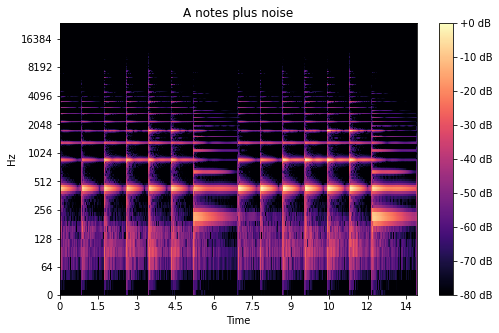

In [ ]:
fig, ax = plt.subplots(figsize=(8,5))
img = librosa.display.specshow(librosa.amplitude_to_db(notes_spectrum, ref=np.max),
                               sr=sr,y_axis='log', x_axis='time', ax=ax)
ax.set_title('A notes plus noise')
fig.colorbar(img, ax=ax, format="%+2.0f dB")

In [ ]:
notes_chroma = librosa.feature.chroma_stft(S=notes_spectrum, sr=sr) #, norm=None)
#notes_chroma = notes_chroma / np.max(notes_chroma) # normalize chroma representation

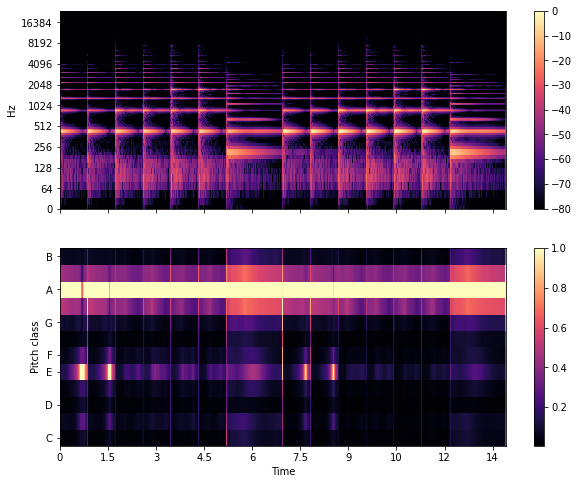

In [ ]:
fig, ax = plt.subplots(nrows=2, sharex=True, figsize=(10,8))
img = librosa.display.specshow(librosa.amplitude_to_db(notes_spectrum, ref=np.max),
                               sr=sr, y_axis='log', x_axis='time', ax=ax[0])
fig.colorbar(img, ax=[ax[0]])
ax[0].label_outer()
img = librosa.display.specshow(notes_chroma, sr=sr, y_axis='chroma',
                               x_axis='time', ax=ax[1])
fig.colorbar(img, ax=[ax[1]])

# Notes - with noise

In [ ]:
# load audio file of piano notes (octave A's) plus white noise
notes_plus_noise, sr = librosa.load('HarmonEQ-Notes_plus_noise.wav', sr=None)

In [ ]:
ipd.Audio(notes_plus_noise, rate=sr)

In [ ]:
# calculate the magnitude spectrum with 2048 point FFT, 
notes_noise_spectrum = np.abs(librosa.stft(notes_plus_noise))

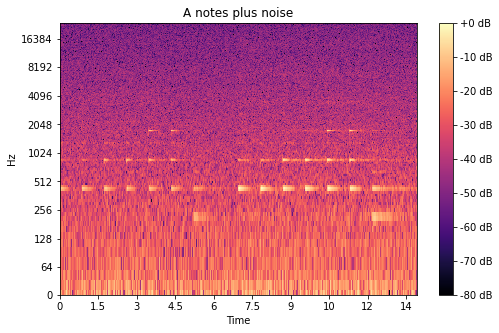

In [ ]:
fig, ax = plt.subplots(figsize=(8,5))
img = librosa.display.specshow(librosa.amplitude_to_db(notes_noise_spectrum, ref=np.max),
                               sr=sr,y_axis='log', x_axis='time', ax=ax)
ax.set_title('A notes plus noise')
fig.colorbar(img, ax=ax, format="%+2.0f dB")

In [ ]:
notes_chroma = librosa.feature.chroma_stft(S=notes_noise_spectrum, sr=sr) #, norm=None)
#notes_chroma = notes_chroma / np.max(notes_chroma) # normalize chroma representation

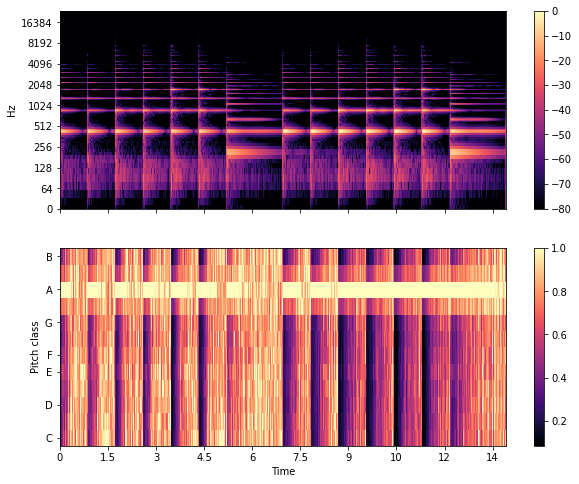

In [ ]:
fig, ax = plt.subplots(nrows=2, sharex=True, figsize=(10,8))
img = librosa.display.specshow(librosa.amplitude_to_db(notes_spectrum, ref=np.max),
                               sr=sr, y_axis='log', x_axis='time', ax=ax[0])
fig.colorbar(img, ax=[ax[0]])
ax[0].label_outer()
img = librosa.display.specshow(notes_chroma, sr=sr, y_axis='chroma',
                               x_axis='time', ax=ax[1])
fig.colorbar(img, ax=[ax[1]])

##  Big notes plot

In [ ]:
notes1 = notes_no_noise[:int(len(notes_no_noise)/2)]
notes2 = notes_plus_noise[:int(len(notes_plus_noise)/2)]
notes3 = notes_plus_noise[int(len(notes_plus_noise)/2):]

In [ ]:
notes1_spec = np.abs(librosa.stft(notes1))
notes2_spec = np.abs(librosa.stft(notes2))
notes3_spec = np.abs(librosa.stft(notes3))

In [ ]:
notes1_chroma = librosa.feature.chroma_stft(S=notes1_spec, sr=sr)
notes2_chroma = librosa.feature.chroma_stft(S=notes2_spec, sr=sr)
notes3_chroma = librosa.feature.chroma_stft(S=notes3_spec, sr=sr)

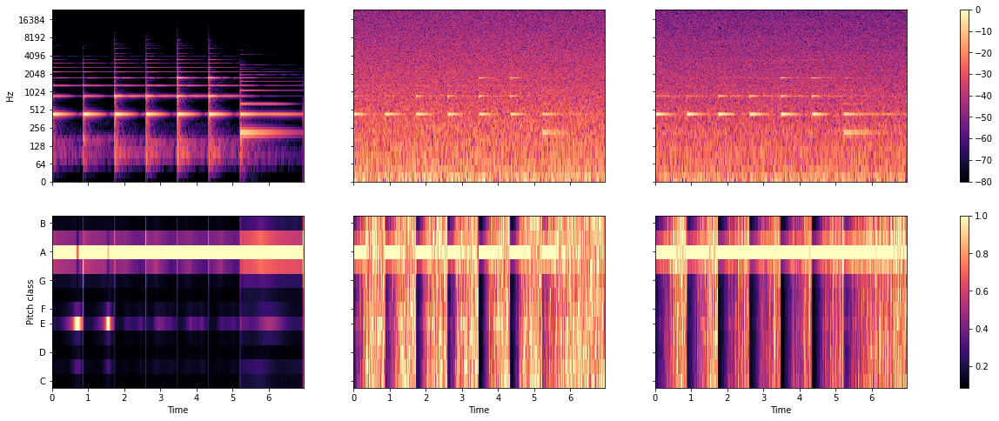

In [79]:
fig, ax = plt.subplots(nrows=2, ncols=3, sharex=True, figsize=(22,8))
img = librosa.display.specshow(librosa.amplitude_to_db(notes1_spec, ref=np.max),
                               sr=sr, y_axis='log', x_axis='time', ax=ax[0][0])
img = librosa.display.specshow(librosa.amplitude_to_db(notes2_spec, ref=np.max),
                               sr=sr, y_axis='log', x_axis='time', ax=ax[0][1])
img = librosa.display.specshow(librosa.amplitude_to_db(notes3_spec, ref=np.max),
                               sr=sr, y_axis='log', x_axis='time', ax=ax[0][2])
fig.colorbar(img, ax=[ax[0]], location='right')
ax[0][0].label_outer()
ax[0][1].label_outer()
ax[0][2].label_outer()
img = librosa.display.specshow(notes1_chroma, sr=sr, y_axis='chroma',
                              x_axis='time', ax=ax[1][0])
img = librosa.display.specshow(notes2_chroma, sr=sr, y_axis='chroma',
                              x_axis='time', ax=ax[1][1])
img = librosa.display.specshow(notes3_chroma, sr=sr, y_axis='chroma',
                              x_axis='time', ax=ax[1][2])
ax[1][1].label_outer()
ax[1][2].label_outer()
fig.colorbar(img, ax=[ax[1]], location='right')

# Chords - no noise

In [ ]:
# load audio file of piano chords (A majors) plus pini noise
chords_no_noise, sr = librosa.load('HarmonEQ-Chords_no_noise.wav', sr=None)

In [ ]:
ipd.Audio(chords_no_noise, rate=sr)

In [ ]:
# calculate the magnitude spectrum with 2048 point FFT, 
chords_spectrum = np.abs(librosa.stft(chords_no_noise))

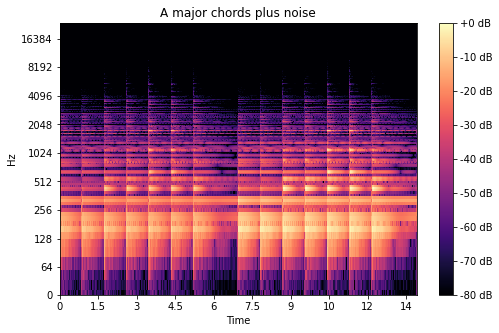

In [ ]:
fig, ax = plt.subplots(figsize=(8,5))
img = librosa.display.specshow(librosa.amplitude_to_db(chords_spectrum, ref=np.max),
                               sr=sr, y_axis='log', x_axis='time', ax=ax)
ax.set_title('A major chords plus noise')
fig.colorbar(img, ax=ax, format="%+2.0f dB")

In [ ]:
chords_chroma = librosa.feature.chroma_stft(S=chords_spectrum, sr=sr) #, norm=None)
#chords_chroma = chords_chroma / np.max(chords_chroma) # normalize chroma representation

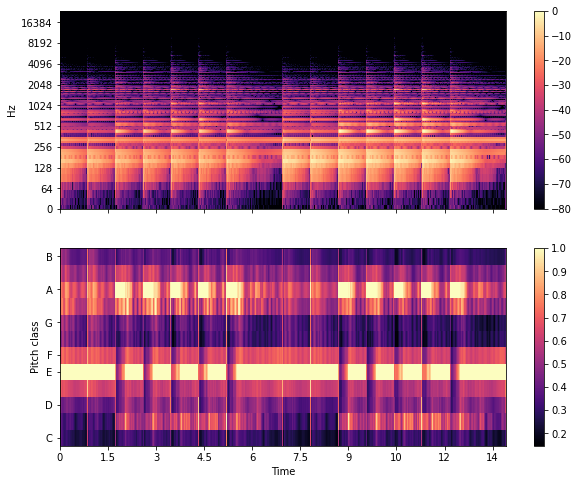

In [ ]:
fig, ax = plt.subplots(nrows=2, sharex=True, figsize=(10,8))
img = librosa.display.specshow(librosa.amplitude_to_db(chords_spectrum, ref=np.max),
                               sr=sr, y_axis='log', x_axis='time', ax=ax[0])
fig.colorbar(img, ax=[ax[0]])
ax[0].label_outer()
img = librosa.display.specshow(chords_chroma, sr=sr, y_axis='chroma',
                               x_axis='time', ax=ax[1])
fig.colorbar(img, ax=[ax[1]])

# Chords - with noise

In [ ]:
# load audio file of piano chords (A majors) plus pini noise
chords_plus_noise, sr = librosa.load('HarmonEQ-Chords_plus_noise.wav', sr=None)

In [ ]:
ipd.Audio(chords_plus_noise, rate=sr)

In [ ]:
# calculate the magnitude spectrum with 2048 point FFT, 
chords_noise_spectrum = np.abs(librosa.stft(chords_plus_noise))

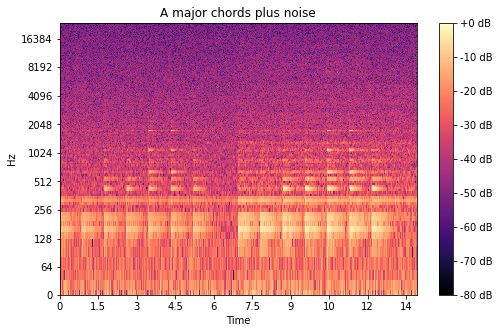

In [ ]:
fig, ax = plt.subplots(figsize=(8,5))
img = librosa.display.specshow(librosa.amplitude_to_db(chords_noise_spectrum, ref=np.max),
                               sr=sr, y_axis='log', x_axis='time', ax=ax)
ax.set_title('A major chords plus noise')
fig.colorbar(img, ax=ax, format="%+2.0f dB")

In [ ]:
chords_chroma = librosa.feature.chroma_stft(S=chords_spectrum, sr=sr) #, norm=None)
#chords_chroma = chords_chroma / np.max(chords_chroma) # normalize chroma representation

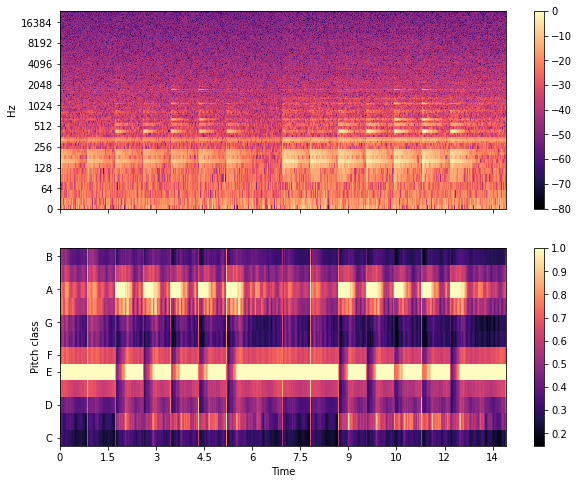

In [ ]:
fig, ax = plt.subplots(nrows=2, sharex=True, figsize=(10,8))
img = librosa.display.specshow(librosa.amplitude_to_db(chords_noise_spectrum, ref=np.max),
                               sr=sr, y_axis='log', x_axis='time', ax=ax[0])
fig.colorbar(img, ax=[ax[0]])
ax[0].label_outer()
img = librosa.display.specshow(chords_chroma, sr=sr, y_axis='chroma',
                               x_axis='time', ax=ax[1])
fig.colorbar(img, ax=[ax[1]])

## Big chord plot

In [ ]:
chords1 = chords_no_noise[:int(len(chords_no_noise)/2)]
chords2 = chords_plus_noise[:int(len(chords_plus_noise)/2)]
chords3 = chords_plus_noise[int(len(chords_plus_noise)/2):]

In [ ]:
chords1_spec = np.abs(librosa.stft(chords1))
chords2_spec = np.abs(librosa.stft(chords2))
chords3_spec = np.abs(librosa.stft(chords3))

In [ ]:
chords1_chroma = librosa.feature.chroma_stft(S=chords1_spec, sr=sr)
chords2_chroma = librosa.feature.chroma_stft(S=chords2_spec, sr=sr)
chords3_chroma = librosa.feature.chroma_stft(S=chords3_spec, sr=sr)

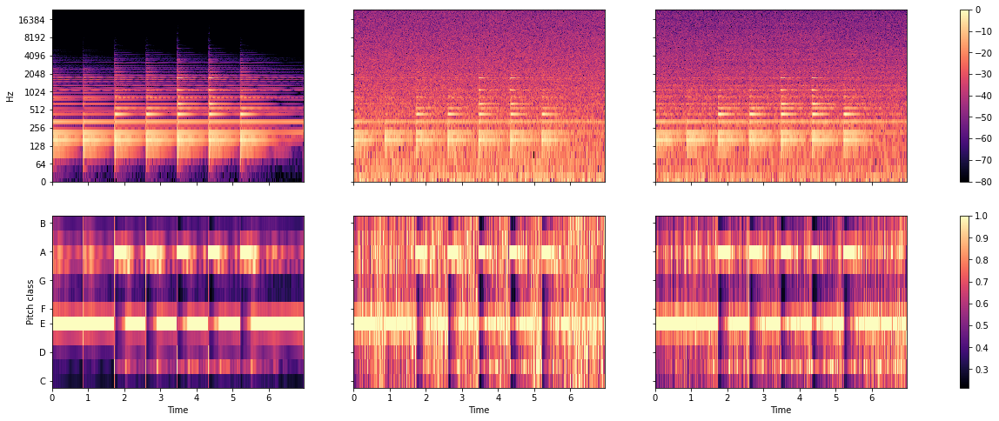

In [ ]:
fig, ax = plt.subplots(nrows=2, ncols=3, sharex=True, figsize=(22,8))
img = librosa.display.specshow(librosa.amplitude_to_db(chords1_spec, ref=np.max),
                               sr=sr, y_axis='log', x_axis='time', ax=ax[0][0])
img = librosa.display.specshow(librosa.amplitude_to_db(chords2_spec, ref=np.max),
                               sr=sr, y_axis='log', x_axis='time', ax=ax[0][1])
img = librosa.display.specshow(librosa.amplitude_to_db(chords3_spec, ref=np.max),
                               sr=sr, y_axis='log', x_axis='time', ax=ax[0][2])
fig.colorbar(img, ax=[ax[0]], location='right')
ax[0][0].label_outer()
ax[0][1].label_outer()
ax[0][2].label_outer()
img = librosa.display.specshow(chords1_chroma, sr=sr, y_axis='chroma',
                              x_axis='time', ax=ax[1][0])
img = librosa.display.specshow(chords2_chroma, sr=sr, y_axis='chroma',
                              x_axis='time', ax=ax[1][1])
img = librosa.display.specshow(chords3_chroma, sr=sr, y_axis='chroma',
                              x_axis='time', ax=ax[1][2])
ax[1][1].label_outer()
ax[1][2].label_outer()
fig.colorbar(img, ax=[ax[1]], location='right')

# Harmonizing Drums

In [ ]:
# load audio file of drum track (raw + processed through HarmonEQ)
drums, sr = librosa.load('HarmonEQ-drum_loop_chords.wav', sr=None)

In [ ]:
ipd.Audio(drums, rate=sr)

In [ ]:
# calculate the magnitude spectrum with 2048 point FFT, 
drums_spectrum = np.abs(librosa.stft(drums))

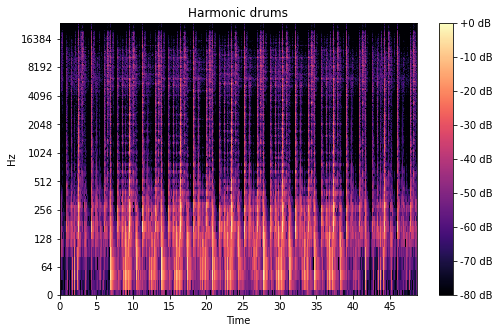

In [ ]:
fig, ax = plt.subplots(figsize=(8,5))
img = librosa.display.specshow(librosa.amplitude_to_db(drums_spectrum, ref=np.max),
                               sr=sr, y_axis='log', x_axis='time', ax=ax)
ax.set_title('Harmonic drums')
fig.colorbar(img, ax=ax, format="%+2.0f dB")

In [ ]:
drums_chroma = librosa.feature.chroma_stft(S=drums_spectrum, sr=sr) #, norm=None)
#drums_chroma = drums_chroma / np.max(drums_chroma) # normalize chroma representation

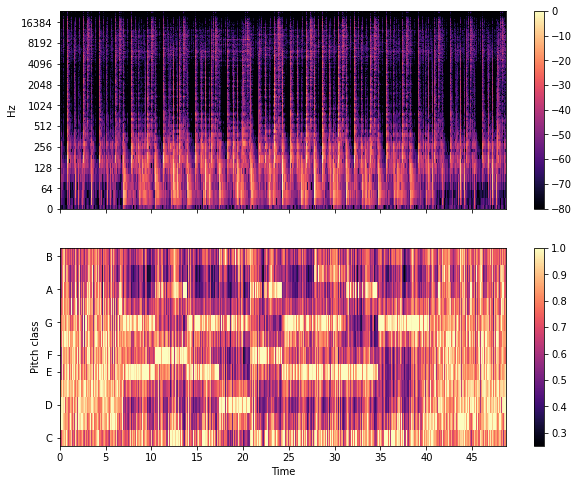

In [ ]:
fig, ax = plt.subplots(nrows=2, sharex=True, figsize=(10,8))
img = librosa.display.specshow(librosa.amplitude_to_db(drums_spectrum, ref=np.max),
                               sr=sr, y_axis='log', x_axis='time', ax=ax[0])
fig.colorbar(img, ax=[ax[0]])
ax[0].label_outer()
# In this figure, the chroma representation is normalized on a frame-by-frame basis
img = librosa.display.specshow(drums_chroma, sr=sr, y_axis='chroma',
                               x_axis='time', ax=ax[1])
fig.colorbar(img, ax=[ax[1]])